## HCML Funda project

In [78]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

### *RANDOM FOREST*

Data Loading and Preprocessing

In [79]:
sns.set_theme(style="whitegrid")

Original size (9706, 13)
After removing na (9706, 13)


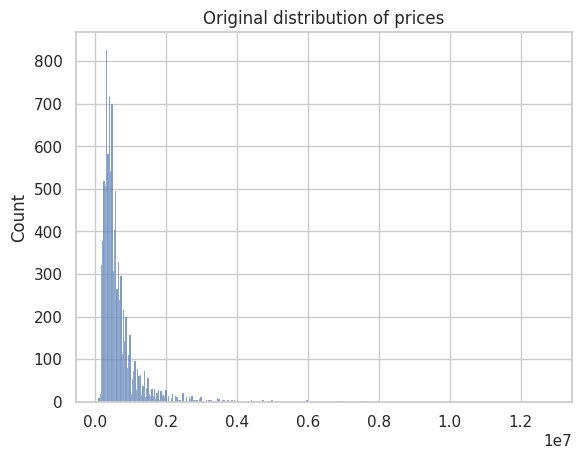

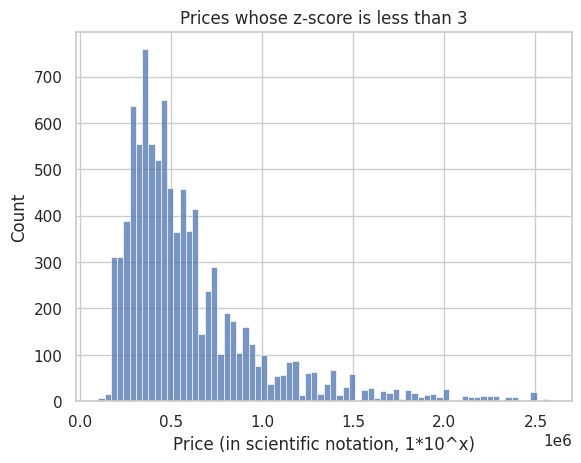

In [111]:
data = pd.read_csv("data/funda_data_11_06_2024.csv")
data = data.drop(columns=['url', 'house_id', 'descrip', 'photo', 'address'])
# Handle missing values
print("Original size", data.shape)
data = data.dropna()
print("After removing na", data.shape)

prices = data["price"].to_numpy()
z_scores = (prices-np.mean(prices))/np.std(prices)

sns.histplot(prices)
plt.title("Original distribution of prices")
plt.show()
sns.histplot(prices[z_scores < 3])
plt.title("Prices whose z-score is less than 3")
plt.xlabel("Price (in scientific notation, 1*10^x)")
plt.savefig("z_norm_prices.png", transparent=True)

In [81]:
data.columns

Index(['city', 'house_type', 'building_type', 'price', 'price_m2', 'room',
       'bedroom', 'bathroom', 'living_area', 'energy_label', 'zip',
       'year_built', 'house_age'],
      dtype='object')

In [107]:
# select those prices that have a z-score less than 3, based on the above histogram
z_threhsold = 3
data = data.iloc[z_scores < z_threhsold]
x_data = data.drop(columns=['price', 'price_m2', "year_built"])
x_idx = x_data.index
y_data = data['price']

# select categorical, ordinal, and numerical columns
# separate features and target variable
ordinal_cols = ['energy_label', 'city', 'house_type', 'building_type', 'zip']
numerical_cols = ['room', 'bedroom', 'bathroom', 'living_area', 'house_age']

# preprocessing pipelines for numerical and categorical data
numerical_transformer = StandardScaler()
ordinal_transformer = OrdinalEncoder()

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('ord', ordinal_transformer, ordinal_cols),
        ('num', numerical_transformer, numerical_cols)
    ])

x_cols = ordinal_cols + numerical_cols
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
x_processed = pipeline.fit_transform(x_data)
x_processed = pd.DataFrame(x_processed, index=x_idx, columns=x_cols)
y_processed = numerical_transformer.fit_transform(y_data.to_numpy().reshape(-1,1)).flatten()

print(x_processed.head())

x_train, x_test, y_train, y_test = train_test_split(x_processed, y_processed, test_size=0.2, random_state=42)

   energy_label  city  house_type  building_type    zip      room   bedroom  \
0           3.0   5.0         1.0            0.0  225.0  1.125398  1.672178   
1           5.0   5.0         1.0            0.0  229.0 -0.498244 -1.105523   
2           3.0   5.0         0.0            0.0  221.0 -1.039458 -1.105523   
3           2.0   5.0         0.0            0.0  201.0 -1.039458 -1.105523   
4           2.0   5.0         0.0            0.0  199.0 -1.039458 -1.105523   

   bathroom  living_area  house_age  
0  0.049308     0.332084  -0.280109  
1  0.049308    -0.734900   3.701712  
2  0.049308    -1.251720  -0.363106  
3  0.049308    -1.168362  -0.184966  
4  0.049308    -1.018317  -0.152577  


Training the Model

In [83]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=42)

model.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

Evaluating the Model

In [84]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error

y_pred = np.asarray(model.predict(x_test).tolist())

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')


Mean Absolute Error: 0.20723826613695023
Mean Squared Error: 0.14023351689499816
Root Mean Squared Error: 0.3744776587394743


Plotting Feature Importance

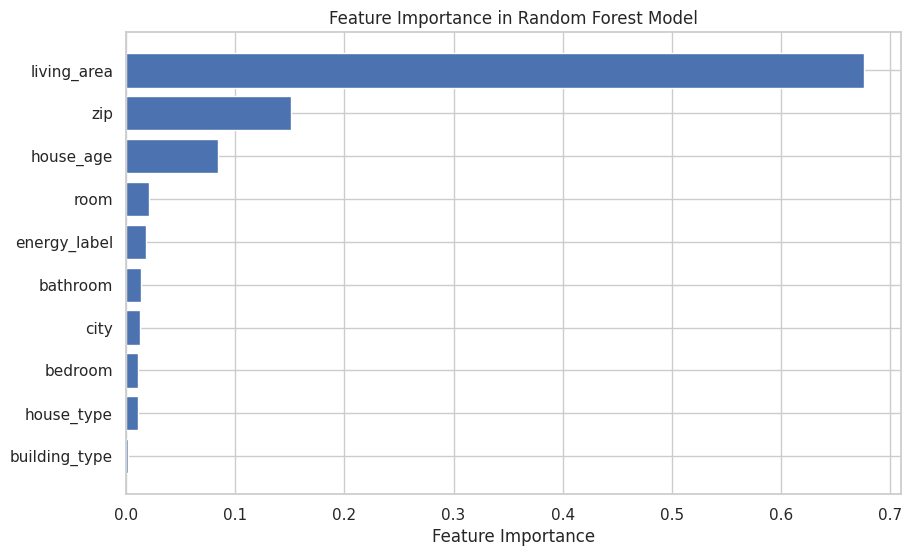

In [85]:
feature_names = model.feature_names_in_
importances = model.feature_importances_

feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'])
plt.xlabel('Feature Importance')
plt.gca().invert_yaxis()
plt.title('Feature Importance in Random Forest Model')
plt.show()


#### Extra: Visualizing Predictions vs Actual Values

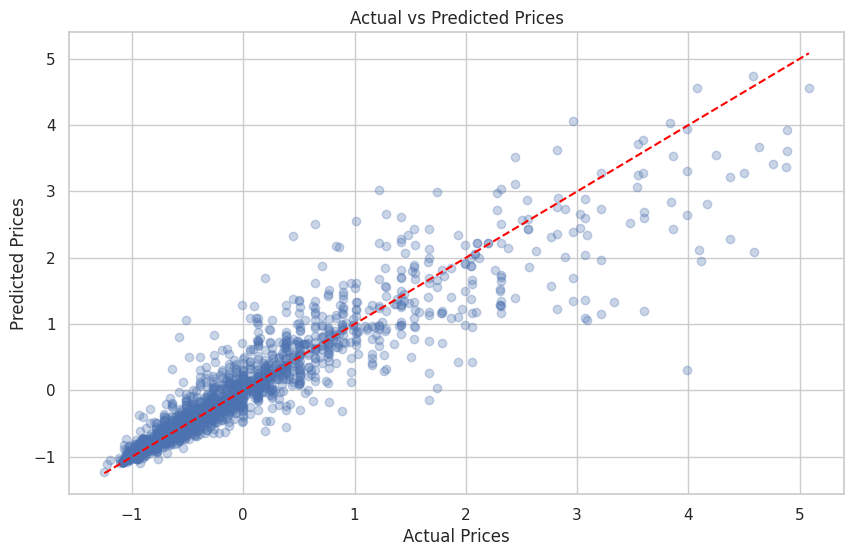

In [86]:
# Scatter plot of predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.show()


#### Extra: Residual Analysis

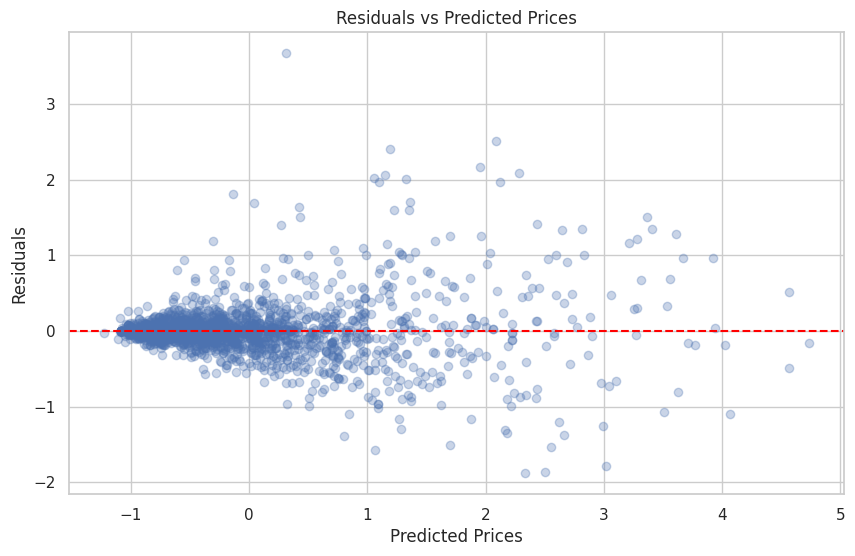

In [87]:
# Calculate residuals
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.3)
plt.xlabel('Predicted Prices')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Prices')
plt.axhline(0, color='red', linestyle='--')
plt.show()


#### Extra: Partial Dependence Plot (PDP)

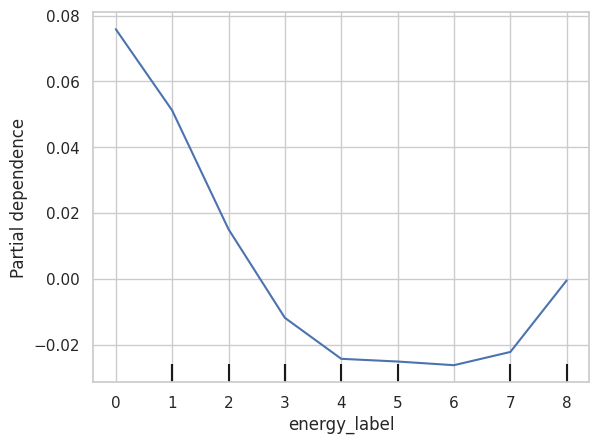

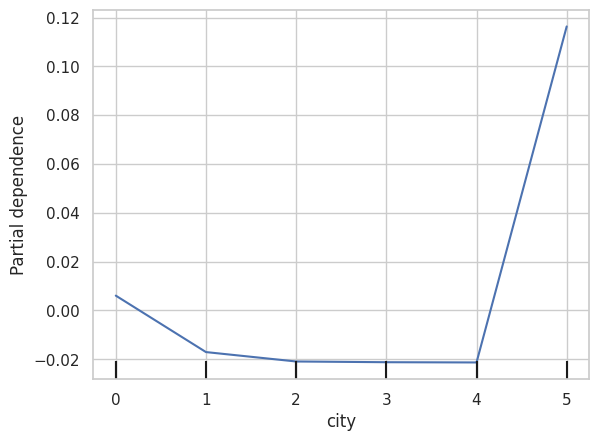

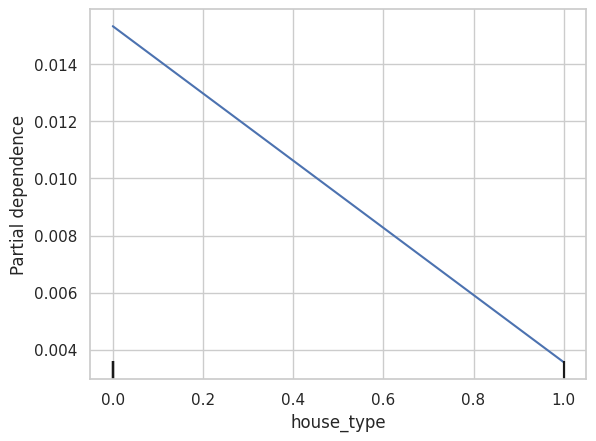

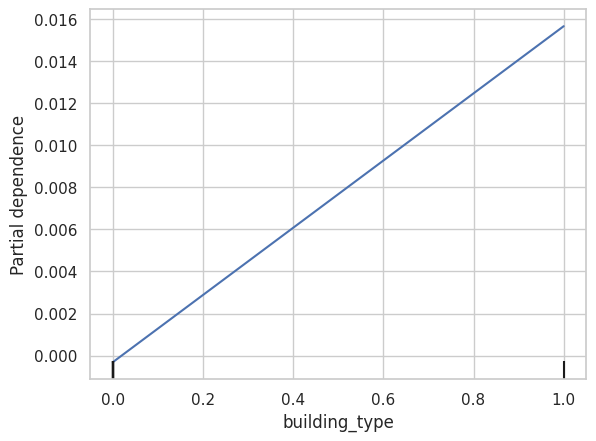

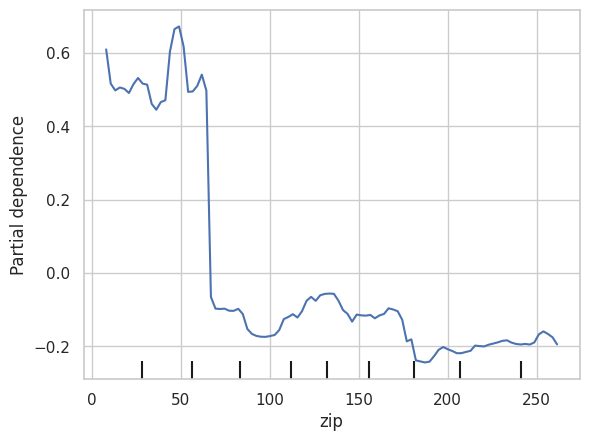

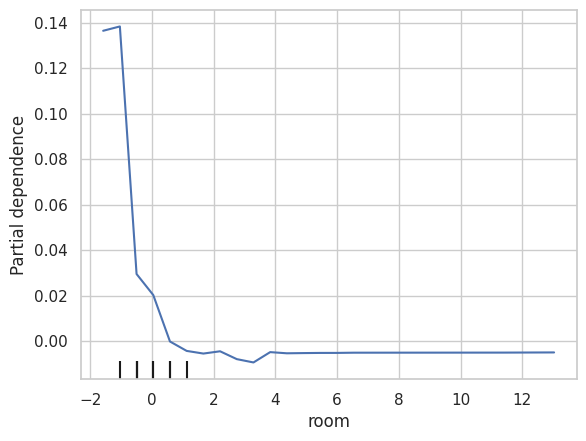

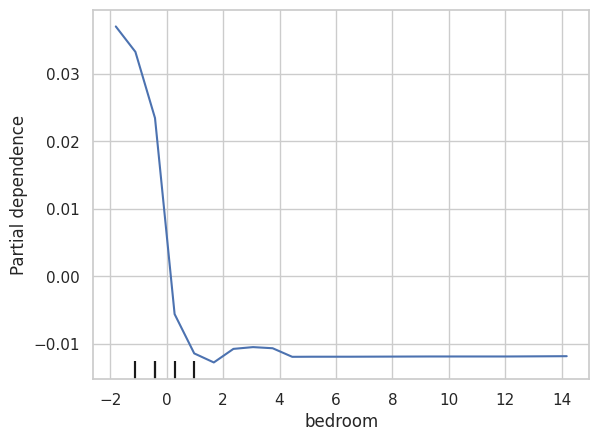

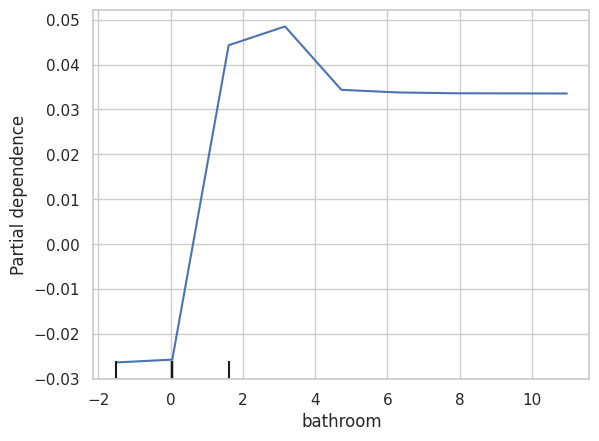

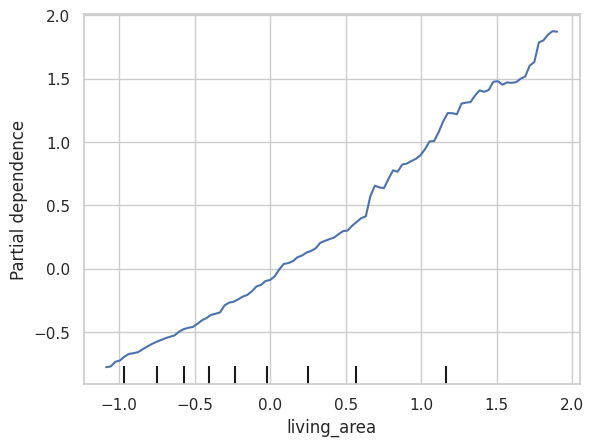

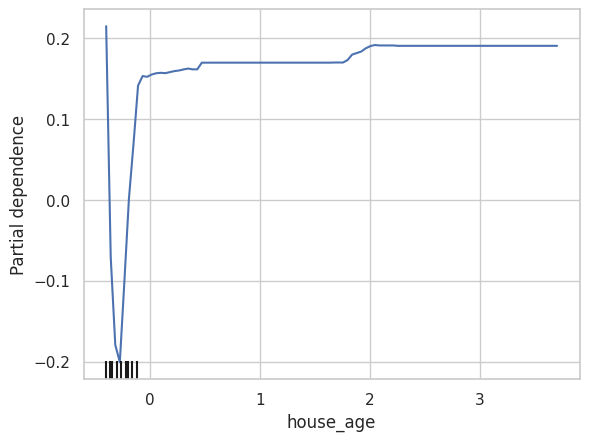

In [88]:
from sklearn.inspection import PartialDependenceDisplay

# Select the ordinal features for PDP
features_to_plot = feature_names

# Iterate through each feature and corresponding axis
for i, feature in enumerate(features_to_plot):
   PartialDependenceDisplay.from_estimator(model, x_processed, [feature])



#### Extra: LIME

In [89]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [90]:
import lime.lime_tabular

x_train_aux = x_train.to_numpy()

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train_aux,
    feature_names=feature_names,
    class_names=['price'],
    mode='regression',
    verbose=True,
    random_state=42
)

num_instances = 3
np.random.seed(42)
indices = np.random.randint(low=0, high=len(x_test), size=num_instances)  # Select random indices
print(f"Entries {indices}")

# Explain each instance
for i in indices:
    print(f"LIME explanation for Entry {i}:")
    exp = explainer.explain_instance(x_test.iloc[i], model.predict, num_features=10)
    exp.show_in_notebook(show_table=True, show_all=True)
    exp.save_to_file(f"rf_lime_{i}.html")
    print("\n")

Entries [1126 1459  860]
LIME explanation for Entry 1126:
Intercept -0.08153808132108073
Prediction_local [0.94701118]
Right: 0.632277876310265


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 



LIME explanation for Entry 1459:


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

Intercept 0.2836216472530288
Prediction_local [0.1377053]
Right: -0.01973801598798514


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 



LIME explanation for Entry 860:


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

Intercept -0.20462566368871496
Prediction_local [1.509095]
Right: 0.22579063155375326


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

#### Extra: SHAP

In [14]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [15]:
import shap

# Initialize SHAP explainer
explainer_rf = shap.TreeExplainer(model)

# Calculate SHAP values
shap_values_rf = explainer_rf.shap_values(x_test)

/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Entries [1126 1459  860]


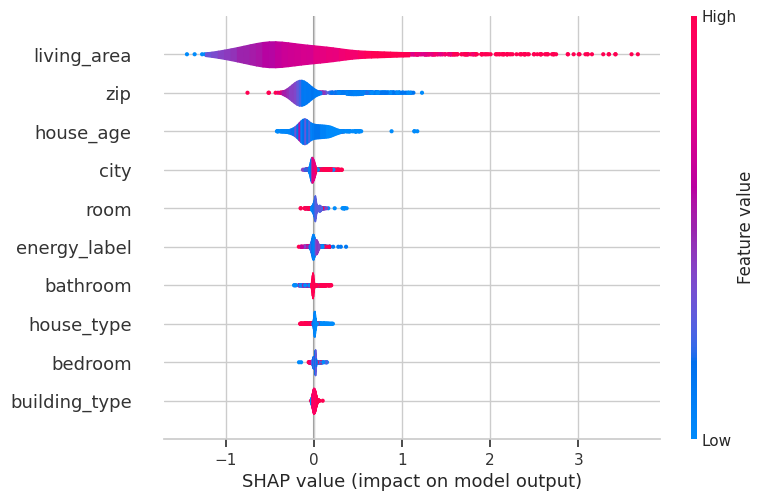

In [91]:
# Visualize the SHAP explanation for the random instance
shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[indices], x_test.iloc[indices], feature_names=feature_names)
shap.plots.violin(shap_values_rf, x_test, feature_names=feature_names)

### *DECICION TREE*

In [92]:
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor(random_state=42, max_depth=4, min_samples_split=10, min_samples_leaf=10)
model.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=4, min_samples_leaf=10, min_samples_split=10,
                      random_state=42)

In [93]:
y_pred = model.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')

Mean Absolute Error: 0.3443810616418588
Mean Squared Error: 0.27201702864988647
Root Mean Squared Error: 0.5215525176335423


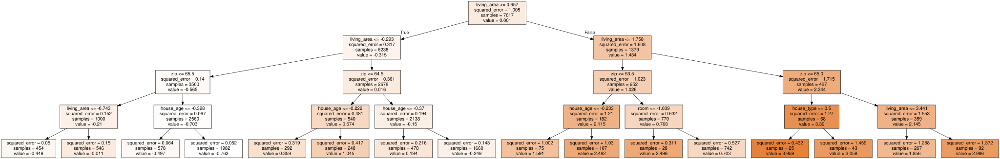

In [94]:
import graphviz
from sklearn import tree

feature_names = model.feature_names_in_

dot_data = tree.export_graphviz(model, out_file=None, feature_names=feature_names, filled=True)
dot_data = dot_data.split("\n")
node_attribute = 'node [shape=box, style="filled", color="black", fontname="helvetica", fontsize=15]'
dot_data[1] = node_attribute
dot_data = "\n".join(dot_data)

graph = graphviz.Source(dot_data, format="png")
graph.render("tree", format="png")

graph

Plotting Feature Importance

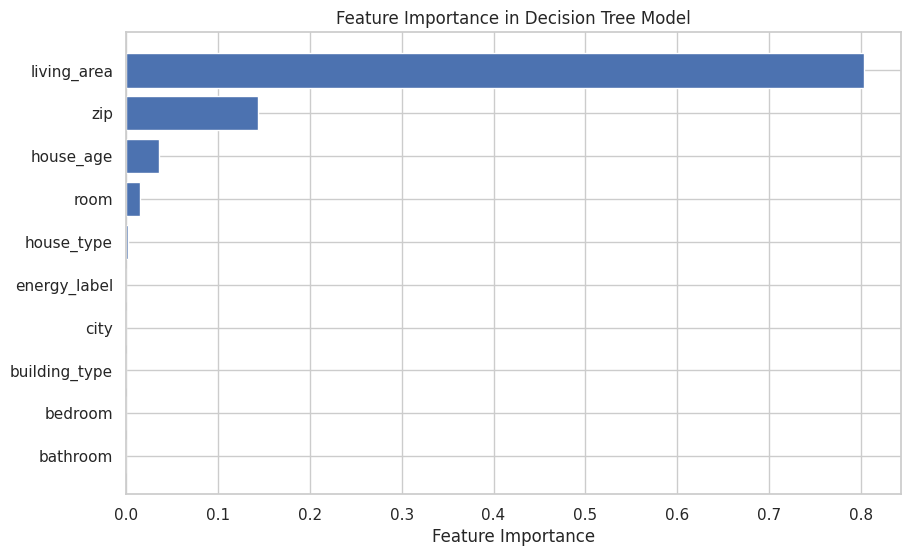

In [95]:
import numpy as np

importances = model.feature_importances_

feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Decision Tree Model')
plt.gca().invert_yaxis()
plt.show()


Partial Dependence Plot

/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([min_val, max_val])


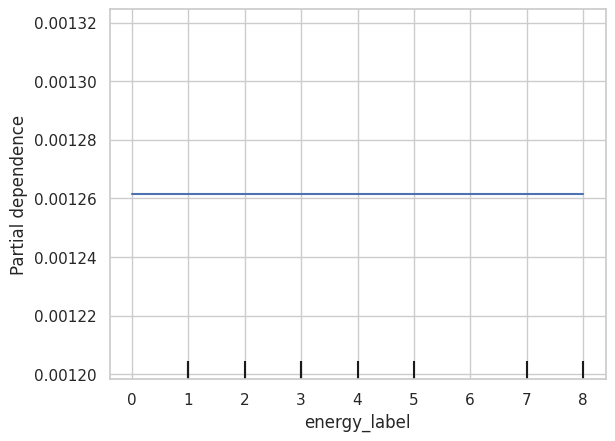

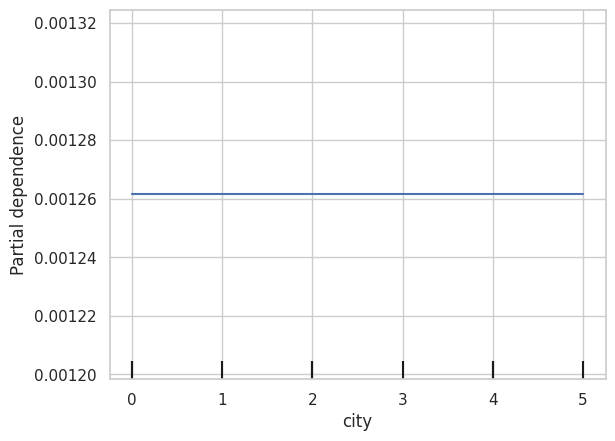

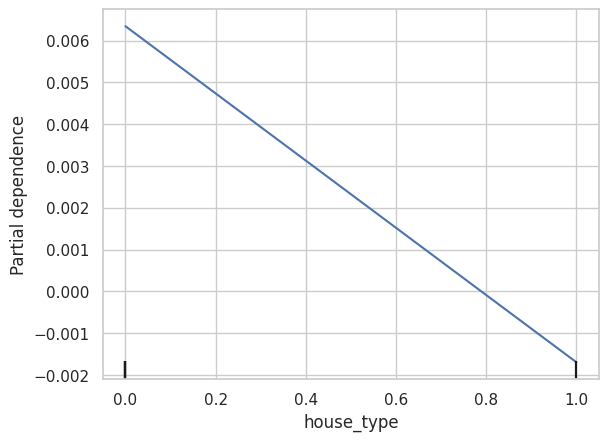

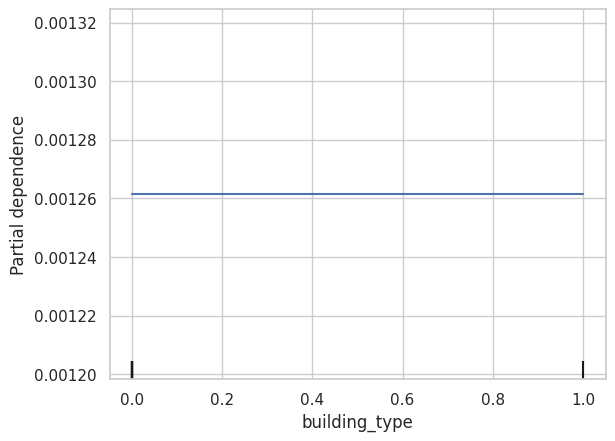

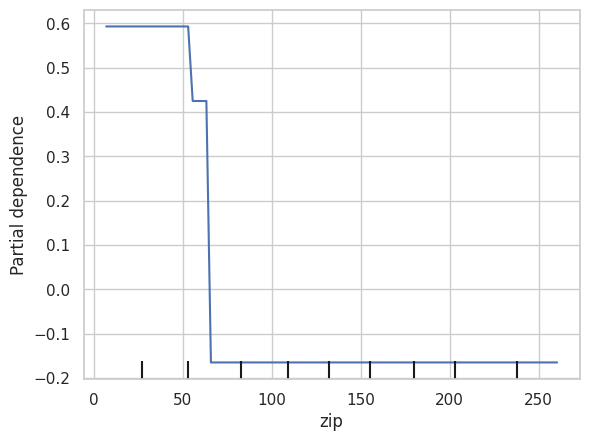

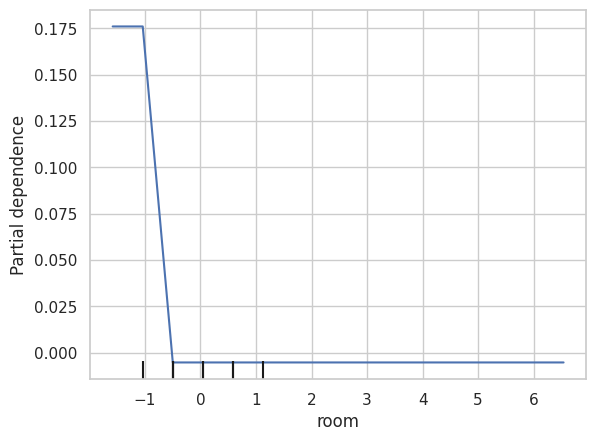

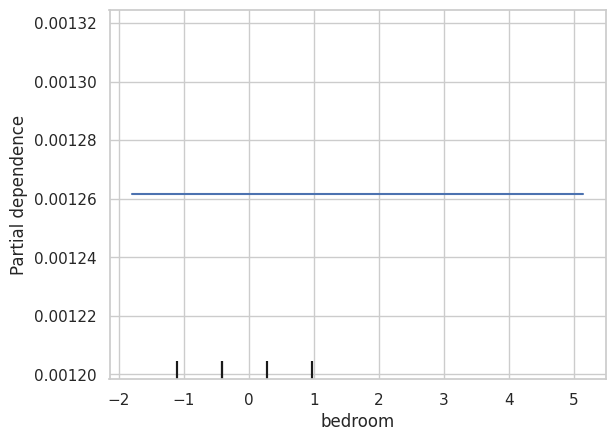

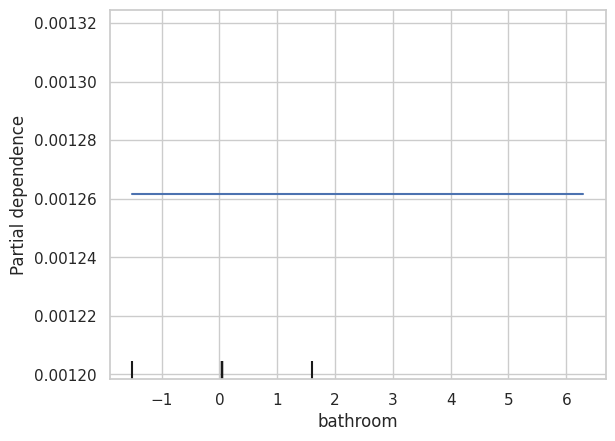

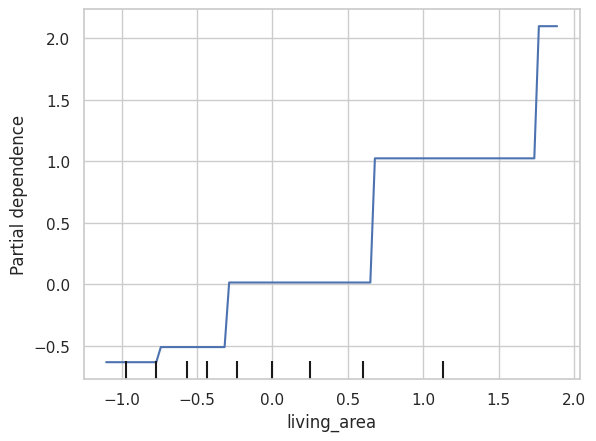

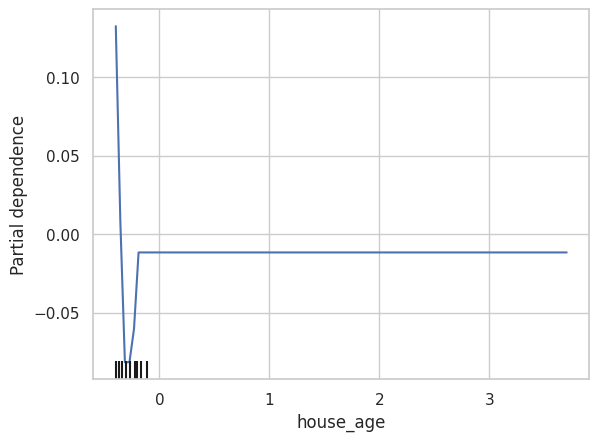

In [96]:
from sklearn.inspection import PartialDependenceDisplay

# Select the ordinal features for PDP
features_to_plot = feature_names

# Iterate through each feature and corresponding axis
for i, feature in enumerate(features_to_plot):
   PartialDependenceDisplay.from_estimator(model, x_test, [feature])

LIME

In [97]:
import lime.lime_tabular

x_train_aux = x_train.to_numpy()

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train_aux,
    feature_names=feature_names,
    class_names=['price'],
    mode='regression',
    verbose=True,
    random_state=42
)

num_instances = 3
np.random.seed(42)
indices = np.random.randint(low=0, high=len(x_test), size=num_instances)  # Select random indices
print(f"Entries {indices}")

# Explain each instance
for i in indices:
    print(f"LIME explanation for Entry {i}:")
    exp = explainer.explain_instance(x_test.iloc[i], model.predict, num_features=10)
    exp.show_in_notebook(show_table=True, show_all=True)
    exp.save_to_file(f"dt_lime_{i}.html")
    print("\n")

Entries [1126 1459  860]
LIME explanation for Entry 1126:
Intercept -0.08353445127345405
Prediction_local [0.7291795]
Right: 0.359087896118049


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 



LIME explanation for Entry 1459:
Intercept 0.21466311654479986
Prediction_local [-0.01265001]
Right: 0.19421975855784265


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 



LIME explanation for Entry 860:
Intercept -0.33186366341390516
Prediction_local [1.4114988]
Right: 0.7029391896610535


/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/keddie/anaconda3/envs/hmcl/lib/python3.12/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

SHAP

In [99]:
explainer_dt = shap.TreeExplainer(model)
shap_values_dt = explainer_dt.shap_values(x_test)

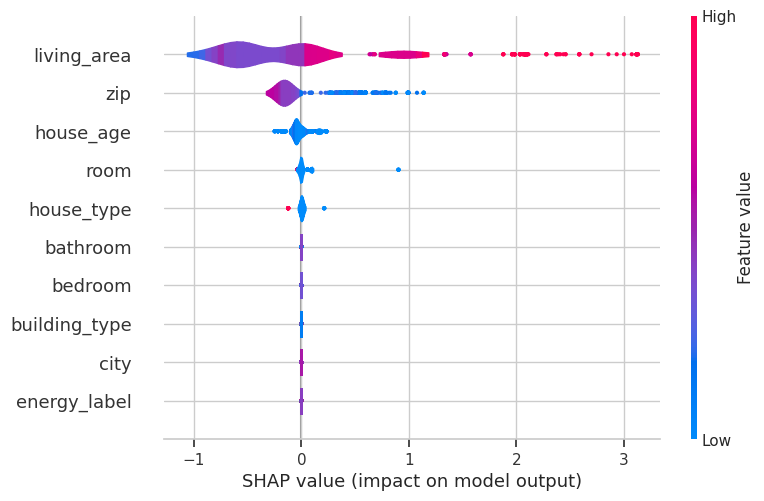

In [100]:
shap.initjs()
shap.plots.violin(shap_values_dt, x_test, feature_names=feature_names)